<a href="https://colab.research.google.com/github/Madhav-Engineer/Accident_detection_and_Warning/blob/main/exercise_5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Exercise 5: Random Forests

**Note**: Please insert the names of all participating students:

1.
2.
3.
4.
5.

In [38]:
import sys, os
if 'google.colab' in sys.modules:
  if os.getcwd() == '/content':
    !git clone 'https://github.com/inb-luebeck/cs5450.git'
    os.chdir('cs5450')

In this exercise, we will use the random forest algorithm to combine multiple decision trees to one strong classifier for a multi-class classification problem on a two-dimensional dataset. The individual trees of the random forest differ because they are trained with a random subset of (i) features — in this exercise a single feature of the two-dimensional dataset
— and (ii) training data. The latter is done by applying the technique of *bootstrap aggregating (bagging)*. Given a dataset $D$ of size n, bagging generates m new training sets $D_i$ , each of size n, by sampling from $D$ uniformly and with replacement. Note
that by sampling with replacement, some observations may be repeated in $D_i$ and some observations are not used at all. They are called *out-of-bag (oob) observations* and can
be used for testing.

We will build on the code which we have provided here. You only need to write code at the places indicated by TODO in the files.
Implement the missing parts in this file. When done correctly, your code should do the following:

1. Create a random dataset.

2. Iterativly, do the following:
    - Randomly select a single feature.
    - Randomly generate a bootstrapped training set.
    - Train a decision tree on the bootstrapped set with a single feature
    - Generate a test set using the out-of-bag samples.
    - Compute the posterior probabilities of the test set.
    - Combine the out-of-bag posterior probabilities over the forest to obtain a prediction for each sample of the complete dataset.
    - Calculate the out-of-bag error of the random forest.
    - Visualize the data and the decision boundaries of the random forest.

3. Plot the out-of-bag error of the random forest for each iteration.

4. Good initial values are: `n_samples=500`, `n_classes=5`, `n_trees=100`, `n_splits=4`, `seed=20`.

You can visualize a decision tree with the function `some_tree.plot_tree`

Helpful Documentation:
- [DecisionTreeClassifier](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html)
- [python sets](https://docs.python.org/2/library/sets.html)
- [random integers](https://docs.scipy.org/doc/numpy-1.15.0/reference/generated/numpy.random.randint.html)

In [39]:
import numpy as np
import random
from sklearn import tree as scikit_tree
import matplotlib.pyplot as plt
from IPython.display import HTML
from matplotlib.animation import FuncAnimation


In [40]:
def gen_data(n_samples, n_classes):
    """
    This function creates a synthetic 2D dataset for a multi-class problem.

    INPUT:
      n_samples : total number of data points to generate
      n_classes : number of different classes

    OUTPUT:
      data   : array of 2D points (x, y)
      labels : class label for each data point
    """

    # Randomly generate a center (x, y) point for each class
    center = np.random.rand(n_classes, 2)

    # Create an array to store all data points (x, y)
    data = np.random.rand(n_samples, 2)

    # Create an array to store class labels for each data point
    labels = np.ones(n_samples)

    # Compute how many samples each class should have
    n_samples_per_class = int(n_samples / n_classes)

    # Loop over each class
    for i in range(n_classes):

        # Generate random noise around the class center
        # This spreads the points so they form a cluster
        r = np.random.randn(n_samples_per_class, 2) / 12.

        # Compute the starting index for this class
        b = i * n_samples_per_class

        # Compute the ending index for this class
        e = (i + 1) * n_samples_per_class

        # Place the noisy points around the class center
        data[b:e, :] = center[i, :] + r

        # Assign the class label 'i' to these data points
        labels[b:e] = i

    # Return the generated data points and their labels
    return data, labels


In [41]:
def get_decision_boundary(data, labels, trees_):

    # Find the minimum and maximum x-values of the data
    xrange = [data[:,0].min(), data[:,0].max()]

    # Find the minimum and maximum y-values of the data
    yrange = [data[:,1].min(), data[:,1].max()]

    # Step size for the grid (smaller = finer resolution)
    inc = 0.01

    # Create a 2D grid of points that covers the entire data range
    x, y = np.meshgrid(
        np.arange(xrange[0], xrange[1], inc),
        np.arange(yrange[0], yrange[1], inc)
    )

    # Store the shape of the grid (used later to reshape results)
    image_shape = x.shape

    # Flatten the grid into a list of (x, y) coordinate pairs
    xy = np.stack([x.flatten(), y.flatten()], -1)

    # Total number of grid points
    n_samples = x.size

    # Number of unique classes in the dataset
    n_classes = (np.unique(labels)).shape[0]

    # Initialize an array to store summed class probabilities
    predictions = np.zeros((n_samples, n_classes))

    # Loop over all trained trees in the forest
    for tree in trees_:

        # Get which feature (x or y) this tree was trained on
        random_feature = tree.feature

        # Predict class probabilities using only that feature
        s = tree.predict_proba(xy[:, random_feature])

        # Accumulate the probabilities across trees
        predictions = predictions + s

    # Average the probabilities across all trees
    predictions = predictions / float(len(trees_))

    # For each grid point, choose the class with the highest probability
    c = predictions.argmax(1)

    # (Optional) confidence value — not used later, but computed here
    a = predictions.max(1).reshape(image_shape)

    # Reshape class predictions back into the grid shape
    c = c.reshape(image_shape)

    # Return the predicted class for each grid point
    return c


In [42]:
class Animation(object):
    """
    This class creates an animation that shows how the decision
    boundaries of the Random Forest change as more trees are added.
    """

    def __init__(self, data, labels, decision_boundaries):
        """
        Constructor of the Animation class.

        INPUT:
            data : 2D data points (x, y)
            labels : class label for each data point
            decision_boundaries : list of 2D grids, where each grid
                                  represents the decision boundary
                                  after adding one more tree
        """

        # Call the constructor of the parent class
        super().__init__()

        # Save all decision boundary grids so we can animate them later
        self.decision_boundaries = decision_boundaries

        # Create a matplotlib figure and axis for plotting
        fig, ax = plt.subplots(figsize=(12, 8))

        # Find the minimum and maximum x-values of the data
        xrange = [data[:, 0].min(), data[:, 0].max()]

        # Find the minimum and maximum y-values of the data
        yrange = [data[:, 1].min(), data[:, 1].max()]

        # Create a color map with a different color for each class
        cmap = plt.cm.get_cmap('jet', lut=n_classes)

        # Plot the original data points, using a different color per class
        for i in range(n_classes):

            # Select all data points that belong to class i
            tmp = data[labels == i, :]

            # Scatter-plot these points in the corresponding class color
            plt.scatter(
                *tmp.T,           # x and y coordinates
                marker='d',       # diamond-shaped marker
                color=cmap(i),    # color corresponding to class i
                s=150,            # marker size
                edgecolor='k'     # black edge around markers
            )

        # Show the first decision boundary as a background image
        im = ax.imshow(
            decision_boundaries[0],     # initial decision boundary
            extent=xrange + yrange,     # align image with data axes
            interpolation='none',       # do not smooth the image
            cmap='jet',                 # color map
            origin='lower',             # origin at bottom-left
            vmin=0,                     # minimum class index
            vmax=n_classes - 1,         # maximum class index
            alpha=.7                    # transparency
        )

        # Store the figure and image so they can be updated later
        self.fig = fig
        self.im = im

    def animate(self, i):
        """
        Update function called for each animation frame.

        INPUT:
            i : index of the current frame
        """

        # Update the image to show the i-th decision boundary
        self.im.set_array(self.decision_boundaries[i])

    def get_animation(self):
        """
        Create and return the animation object.
        """

        # Create the animation by repeatedly calling animate()
        return FuncAnimation(
            self.fig,                     # figure to animate
            self.animate,                 # update function
            frames=len(self.decision_boundaries)  # number of frames
        )



In [43]:

class MyTree():
    """
    This class is a small wrapper around a scikit-learn decision tree.
    It stores which feature the tree was trained on and provides
    helper functions for prediction and visualization.
    """

    def __init__(self, tree, feature):
        # Store the trained scikit-learn decision tree
        self.clf = tree

        # Store which feature (0 or 1) this tree uses
        self.feature = feature

    def predict_proba(self, x):
        """
        Predict class probabilities for input data.

        INPUT:
            x : one-dimensional array of feature values
        """

        # Ensure the input is a 1D array
        assert x.ndim == 1

        # Reshape input to 2D because scikit-learn expects 2D input
        x = x.reshape(x.shape[0], 1)

        # Return class probability predictions from the tree
        return self.clf.predict_proba(x)

    def predict(self, x):
        """
        Predict class labels for input data.
        """
        return self.clf.predict(x)

    def plot_tree(self):
        """
        Visualize the structure of the decision tree.
        """
        scikit_tree.plot_tree(self.clf)


def train_tree(data, labels, feature, n_splits):
    """
    Train a single decision tree using one randomly selected feature.

    INPUT:
        data : one-dimensional array containing a single feature
        labels : class labels corresponding to the data
        feature : index of the selected feature (0 or 1)
        n_splits : maximum depth of the tree (controls complexity)

    OUTPUT:
        A MyTree object containing the trained decision tree
    """

    # Ensure that only one feature is used for training
    assert data.ndim == 1, 'After random feature selection, trainData must be single-column'

    # Reshape data to 2D format required by scikit-learn
    data = data.reshape((data.shape[0], 1))

    # Create a decision tree classifier with limited depth
    tree = scikit_tree.DecisionTreeClassifier(
        max_depth=n_splits,      # limits tree complexity
        criterion='entropy'      # uses information gain
    )

    # Train the decision tree on the given data and labels
    tree = tree.fit(data, labels)

    # Wrap the trained tree together with its feature index
    return MyTree(tree, feature)

# The commented line below is a MATLAB equivalent of the decision tree training
# tree = fitctree(data, labels, 'MaxNumSplits', nSplits, 'SplitCriterion', 'deviance')


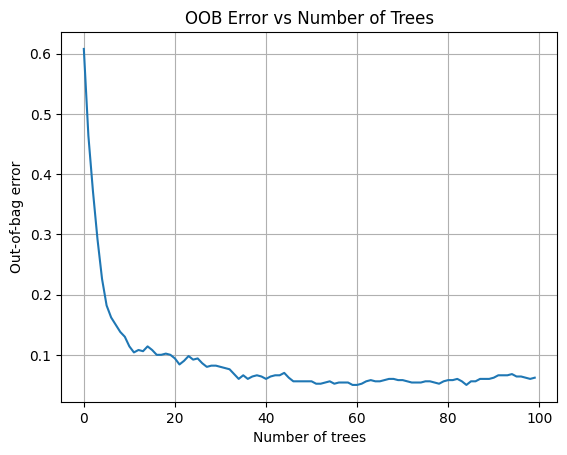

In [44]:
## Generate data
# Create a synthetic 2D dataset with multiple classes
data, labels = gen_data(n_samples, n_classes)

# List that will store all trained decision trees
trees_ = list()

# Array to store posterior class probabilities
# Dimensions: (sample index, tree index, class index)
posterior = np.zeros((n_samples, n_trees, n_classes))

# List to store the out-of-bag error after each tree
errors = list()

# List to store decision boundaries for visualization
decision_boundaries = []

# Loop over the number of trees to build the Random Forest
for t in range(n_trees):

    # Randomly select one feature (0 = x-coordinate, 1 = y-coordinate)
    feature = random.randint(0, 1)

    # Bootstrap sampling: randomly select n_samples indices with replacement
    train_idx = np.random.randint(0, n_samples, n_samples)

    # Extract the selected feature values for the training samples
    train_data = data[train_idx, feature]

    # Extract the corresponding labels for the training samples
    train_labels = labels[train_idx]

    # Train a decision tree using the selected feature and bootstrapped data
    tree_t = train_tree(train_data, train_labels, feature, n_splits)

    # Add the trained tree to the forest
    trees_.append(tree_t)

    # Determine out-of-bag (OOB) sample indices
    # These are samples not included in the bootstrap set
    all_idx = set(range(n_samples))
    oob_idx = np.array(list(all_idx - set(train_idx)))

    # Only proceed if there are any OOB samples
    if len(oob_idx) > 0:

        # Extract the selected feature values for OOB samples
        test_data = data[oob_idx, feature]

        # Extract the true labels of OOB samples
        test_labels = labels[oob_idx]

        # Compute class probability predictions for OOB samples
        scores = tree_t.predict_proba(test_data)

        # Store the OOB probabilities for this tree
        posterior[oob_idx, t, :] = scores

    # Combine posterior probabilities from all trees built so far
    # Count how many trees contributed a prediction for each sample
    valid_trees = np.maximum(
        1,
        np.count_nonzero(posterior[:, :t+1, :].sum(axis=2), axis=1)
    )

    # Compute the average posterior probability for each sample
    avg_posterior = posterior[:, :t+1, :].sum(axis=1) / valid_trees[:, None]

    # Predict the class with the highest average probability
    predictions = avg_posterior.argmax(axis=1)

    # Compute out-of-bag error
    # Only consider samples that have at least one OOB prediction
    mask = valid_trees > 0
    oob_error = np.mean(predictions[mask] != labels[mask])

    # Store the OOB error for this iteration
    errors.append(oob_error)

    # Compute and store the current decision boundary for visualization
    decision_boundaries.append(
        get_decision_boundary(data, labels, trees_)
    )

# Plot the out-of-bag error as a function of the number of trees
plt.figure()
plt.plot(errors)
plt.xlabel("Number of trees")
plt.ylabel("Out-of-bag error")
plt.title("OOB Error vs Number of Trees")
plt.grid(True)
plt.show()


In [45]:

## Define variables

n_samples = 500
n_classes = 5
n_trees = 100
n_splits = 3
seed = 20

random.seed(seed)
np.random.seed(seed)


/tmp/ipython-input-2933995038.py:35: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('jet', lut=n_classes)


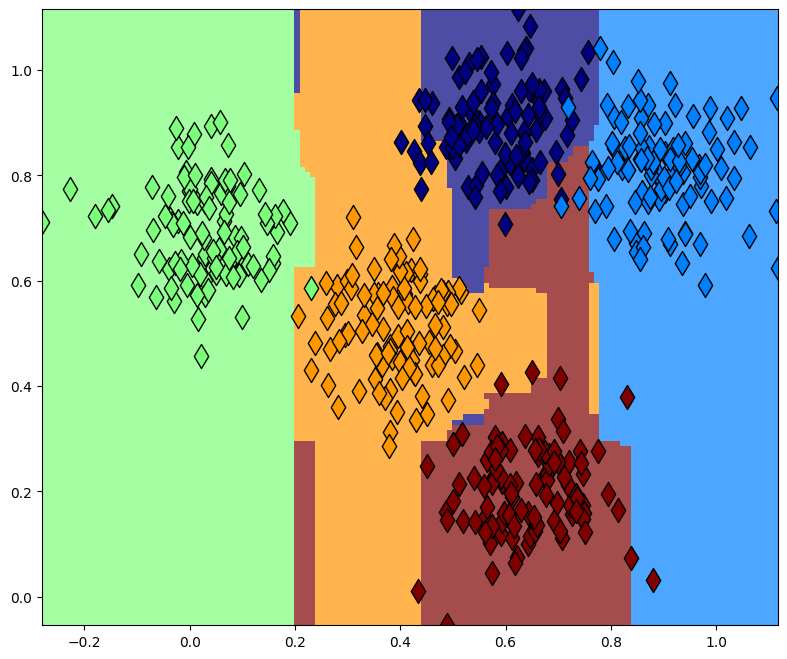

In [46]:
# Animation
animation = Animation(data, labels, decision_boundaries)
HTML(animation.get_animation().to_jshtml())



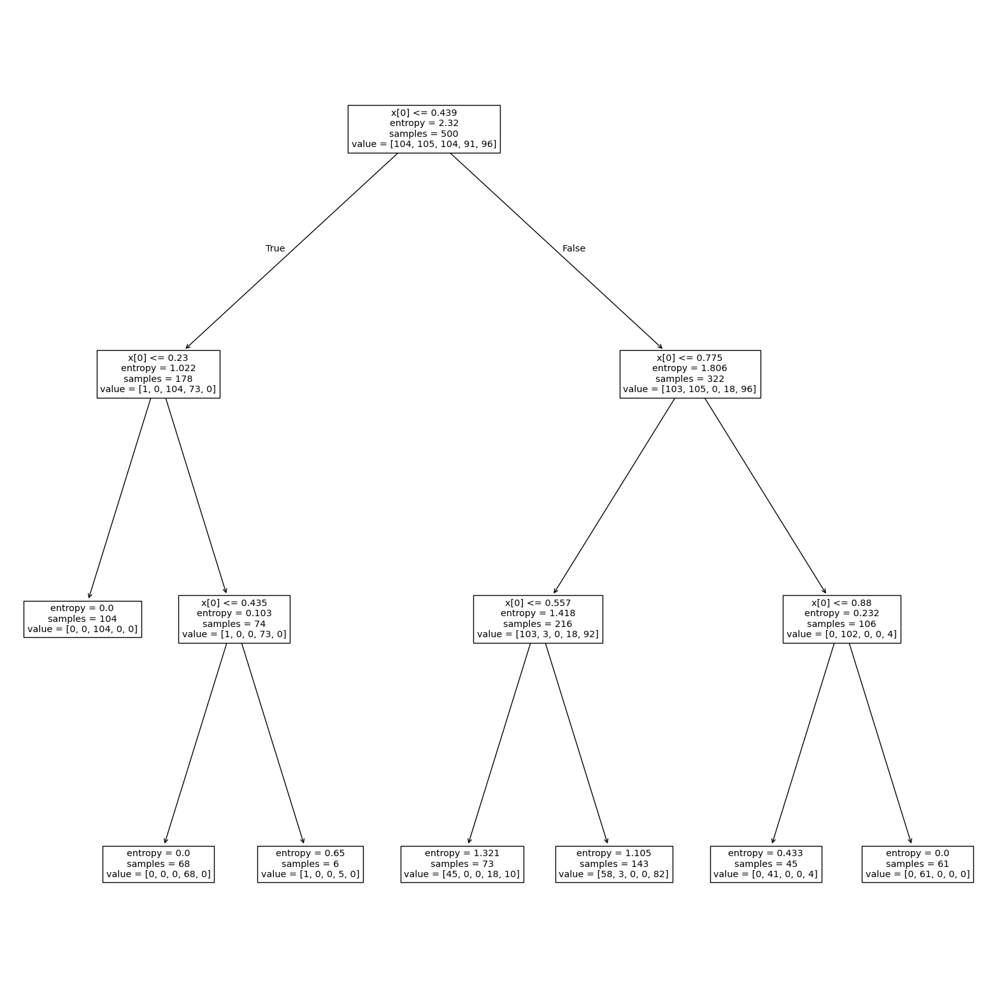

In [47]:
# Plot one of the trees
plt.figure(figsize=(20, 20))
trees_[0].plot_tree()
plt.show()

1. Unlike a SVM, a decision tree is intrinsically suited for a multi-class problem.

[Your answer]

2. A decision tree cannot be used for regression.

[Your answer]

3. Pure nodes of a decision tree (i.e. only a single class is present) have a high entropy.

[Your answer]

4. A decision stump (a one-level decision tree) is prone to overfitting.

[Your answer]

5. Pruning a decision tree can be useful to avoid overfitting.

[Your answer]

6. Each decision tree in a random forest is identical.

[Your answer]

7. The expected fraction of unique observations in a bootstrap dataset is approximately $63.2 \%$.

[Your answer]

8. The out-of-bag error estimates the generalization error of the random forest.

[Your answer]

9. A random forest can be both trained and tested in parallel.

[Your answer]